# **MEF Metric Plotter - Looped**
## **High Resolution Sea Ice Diagsnostics Toolset**
 Cameron Carver - University of Cape Town - Jan 2025

This script accesses the locally stored multi-model MEF file and plots the following for each model:<br>
    - Annual Mean<br>
    - Seasonal Mean<br>
    - Monthly Mean<br>
    - Time Series<br>
    - Seasonal Distribution<br>
    - Monthly Distribution<br>

### 1. Import Relevant Packages

In [1]:
import os
# os.chdir('') # User can provide root directory information here to simplify directory path definitions elsewhere 
import xarray as xr
import calendar
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from mpl_toolkits.basemap import Basemap

### 2. Import Model Data
Select cumulative MEF metric file containing metrics desired to be plotted.
Multiple can be combined by uncommenting the appropriate line defined below. 

Extract respective categorised MEF Metrics

In [2]:
## Combine multiple cumulative MEF datasets
# MEF1 = xr.open_dataset('CMIP-MEF/CMIP-24-MEF_DEF.nc') #CMIP
# MEF2 = xr.open_dataset('HRMIP-MEF/HRMIP-6-MEF_DEF.nc') #HighResMIP
# MEF_ds = xr.concat([MEF1, MEF2],dim=('models'))
# MEF_ds = MEF_ds.sortby('model_name')

MEF_ds = xr.open_dataset('HRMIP-MEF/HRMIP-6-MEF_DEF.nc') #HighResMIP
MEF_ds = MEF_ds.sortby('model_name')

MEF_a, MEF_s, MEF_m, MEF_b, model = MEF_ds.MEF_a, MEF_ds.MEF_s, MEF_ds.MEF_m, MEF_ds.MEF_b, MEF_ds.model_name.values
mct = MEF_ds.models.size

### 3. Import Reference Grid and Define Plotting Details
Import the ancillary file of the observational data. <br>
Data Access https://nsidc.org/data/g02202/versions/4 <br>
Ancilliary File: https://noaadata.apps.nsidc.org/NOAA/G02202_V4/ancillary/<br>
Provides the reference grid of which model data will be reprojected onto.

In [3]:
# Import reference grid from NSIDC anciliarry file
access_ref_data = 'OBSERVATIONS/SICONC/G02202-cdr-ancillary-sh.nc'
ref_ds = xr.open_dataset(access_ref_data)

# Plotting details
levels=[ 0, 0.2, 0.5, 0.65, 1.0]
colors = ['peru', 'yellowgreen', 'deepskyblue', 'royalblue']
cmap = mcolors.ListedColormap(colors)
cmap.set_under('darkred')

m = Basemap(projection='spstere', boundinglat=-50, lon_0=180, resolution='l')   # Create a Basemap instance with South Polar Stereographic projection
x, y = m(ref_ds.longitude.values, ref_ds.latitude.values)       # Convert latitude and longitude to map projection coordinates

### 4. Plot Annual Mean

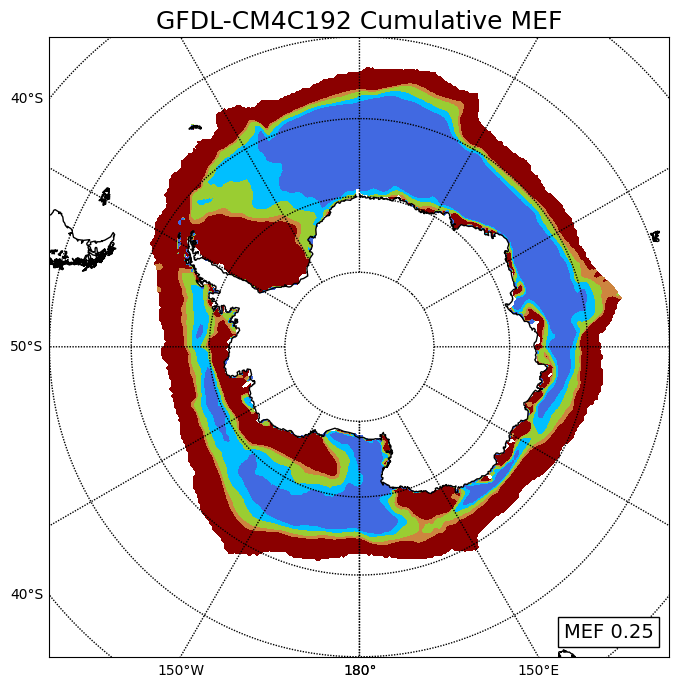

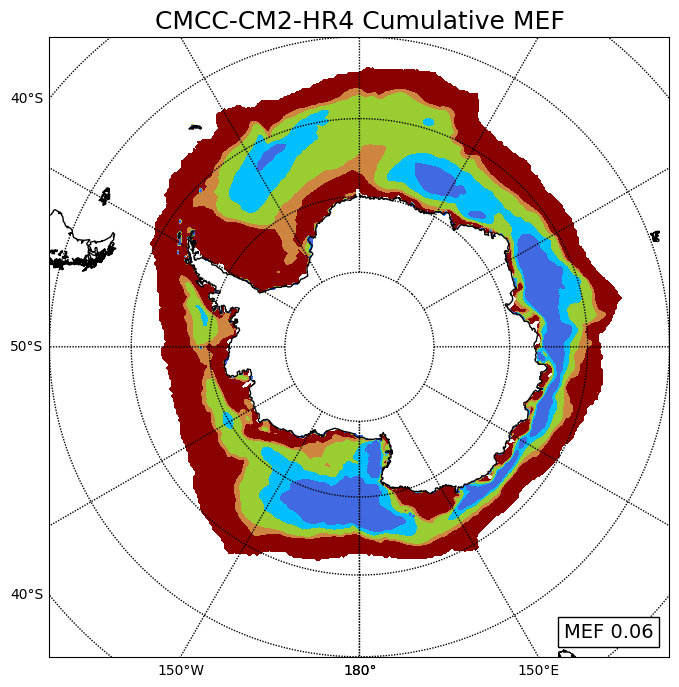

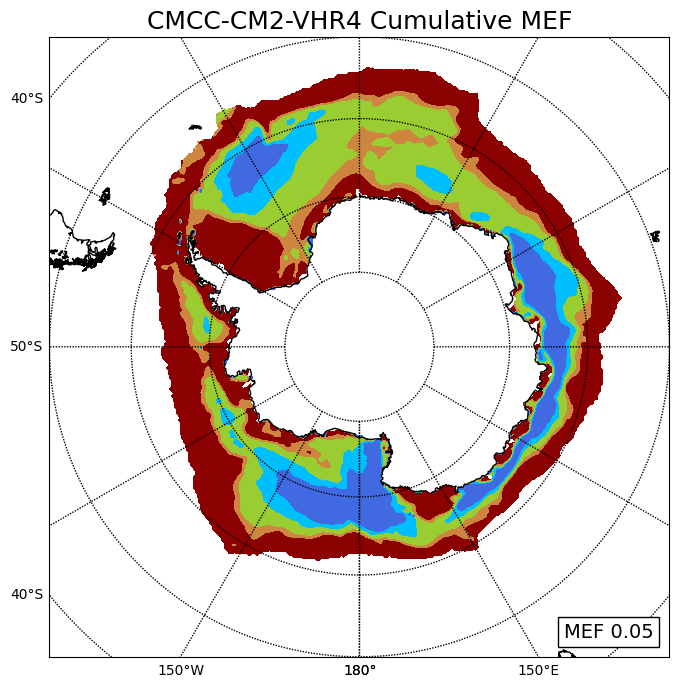

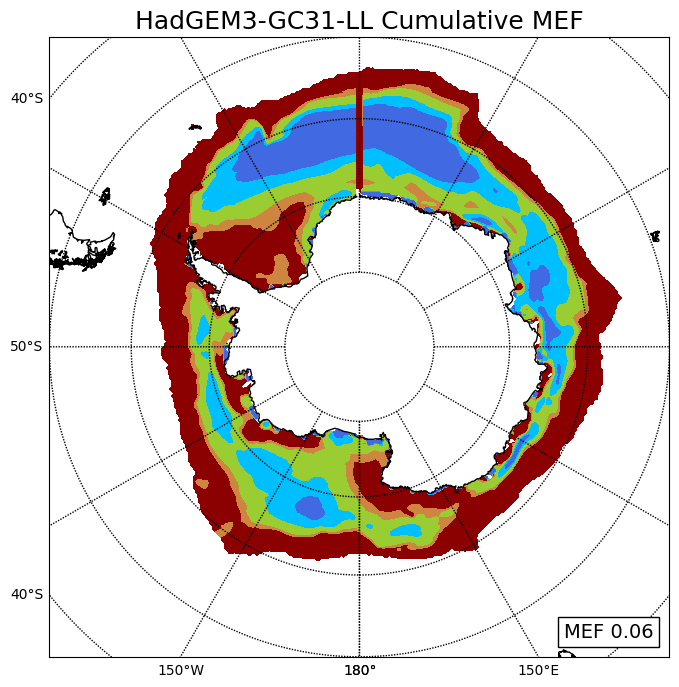

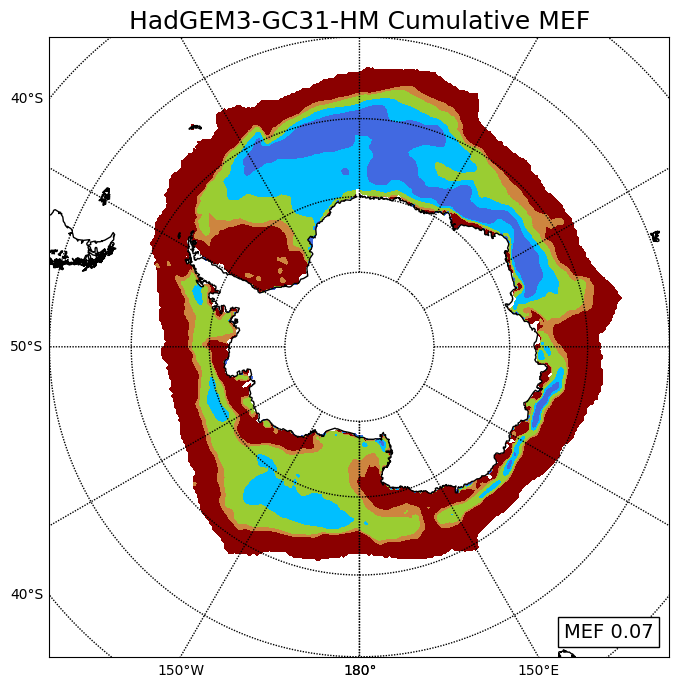

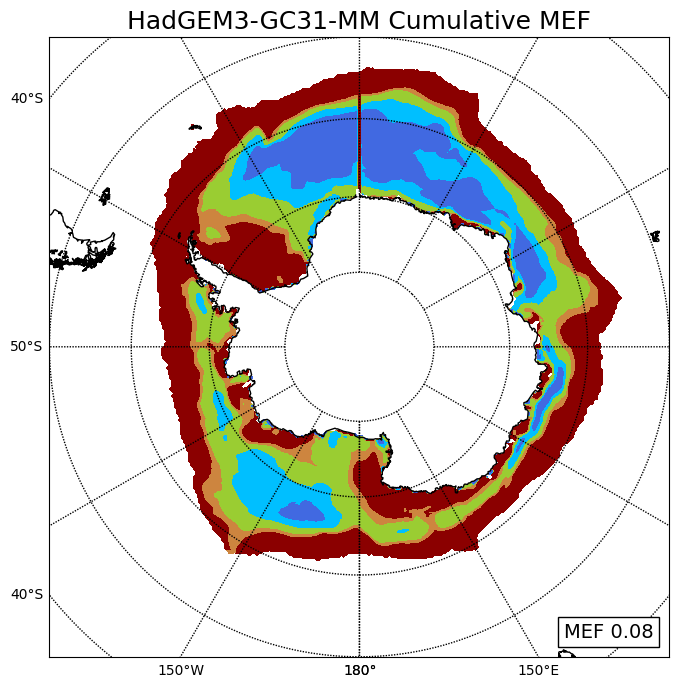

In [4]:
for j in range (mct):
    plt.figure(figsize=(8, 10))
    m.contourf(x, y, MEF_a[j,:,:].values, cmap=cmap, levels=levels, extend='min')
    m.drawcoastlines()
    m.drawparallels(np.arange(-90., 0., 10.), labels=[1,0,0,0])
    m.drawmeridians(np.arange(-180., 181., 30.), labels=[0,0,0,1])
    plt.title(f'{model[j]} Cumulative MEF', fontsize=18)
    MEFA = MEF_b[j,:].mean(dim='tdim').values
    plt.text(0.88, 0.2, f'MEF {MEFA:.2f}', fontsize=14, bbox=dict(facecolor='white'), 
             transform=plt.gcf().transFigure, ha='right', va='bottom')
    
    # plt.savefig(f'/Data/PLOTS/Spatial/Annual-Mean/{model[j]}_AM.pdf', bbox_inches='tight')

### 5. Plot Seasonal Mean

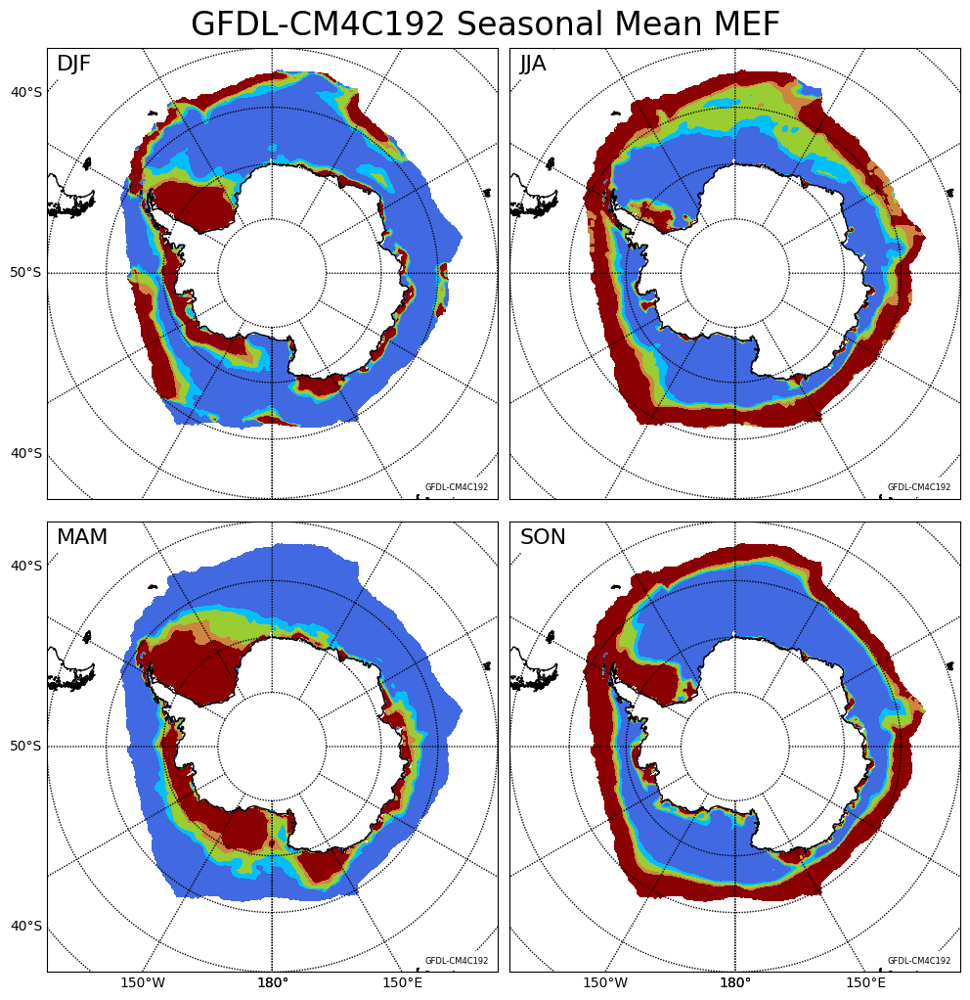

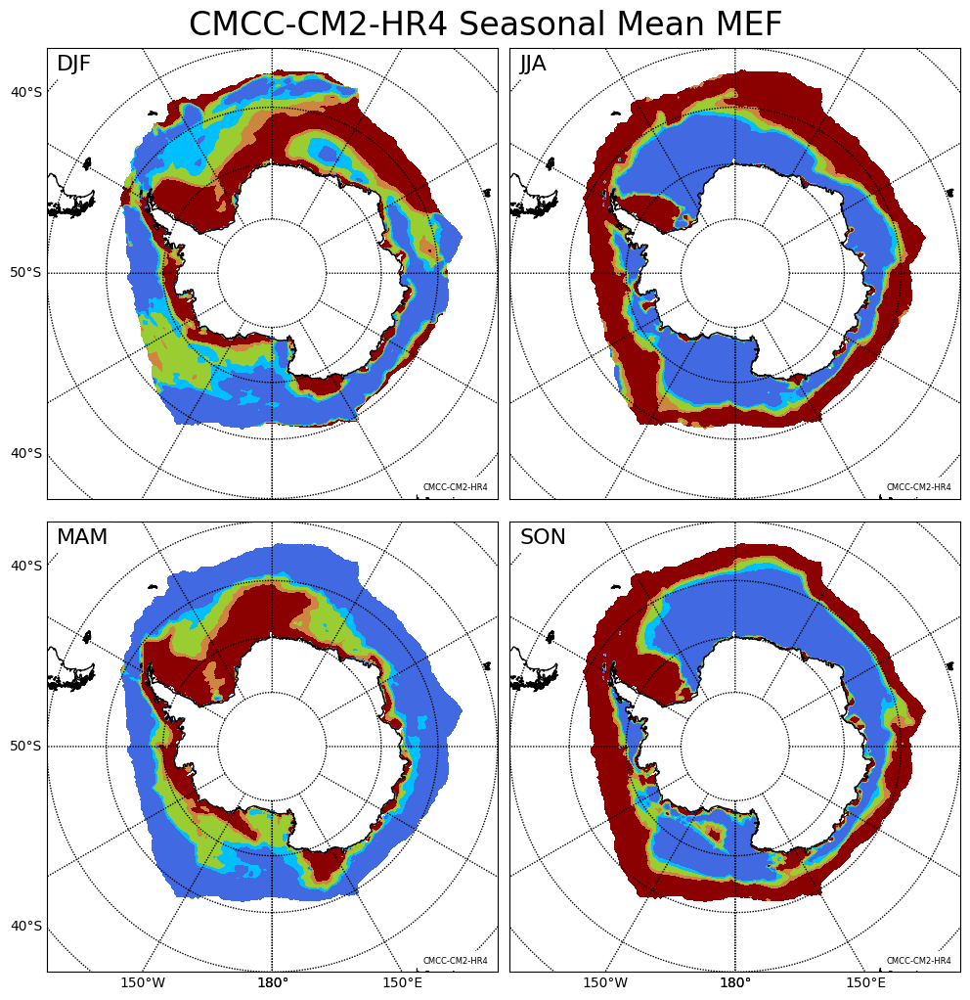

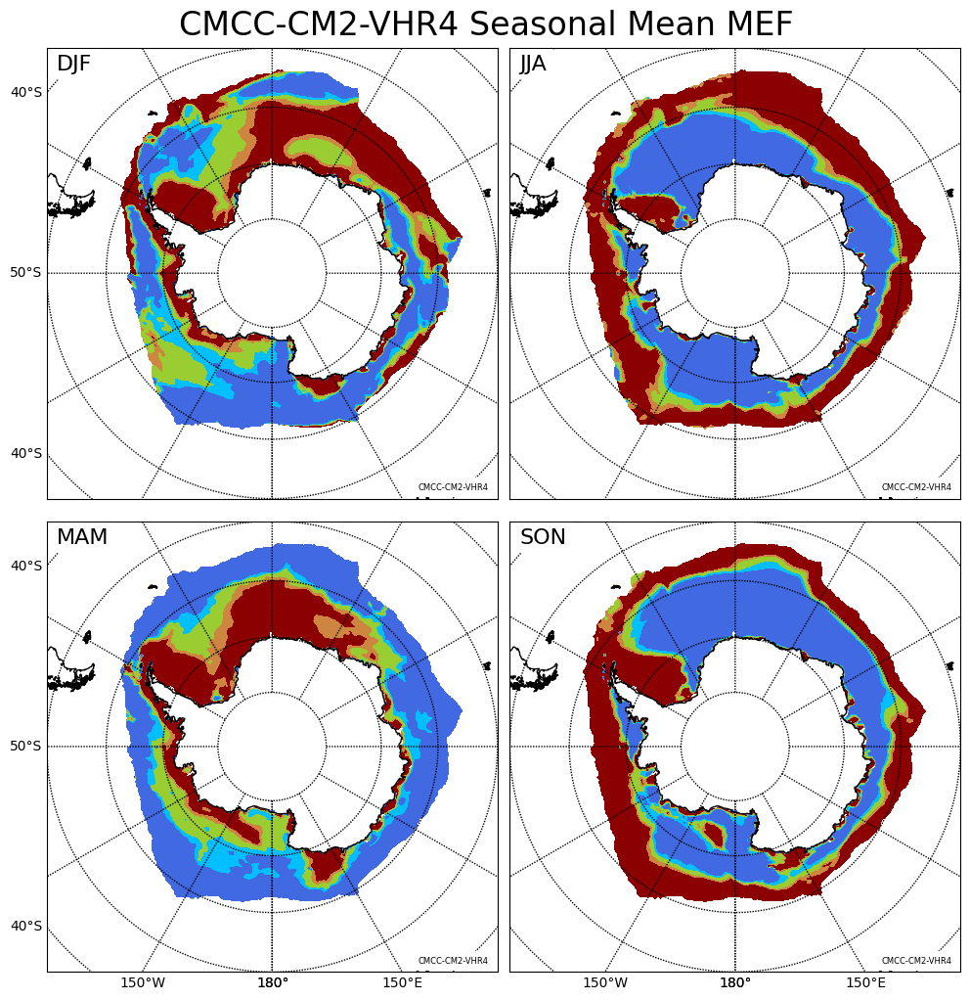

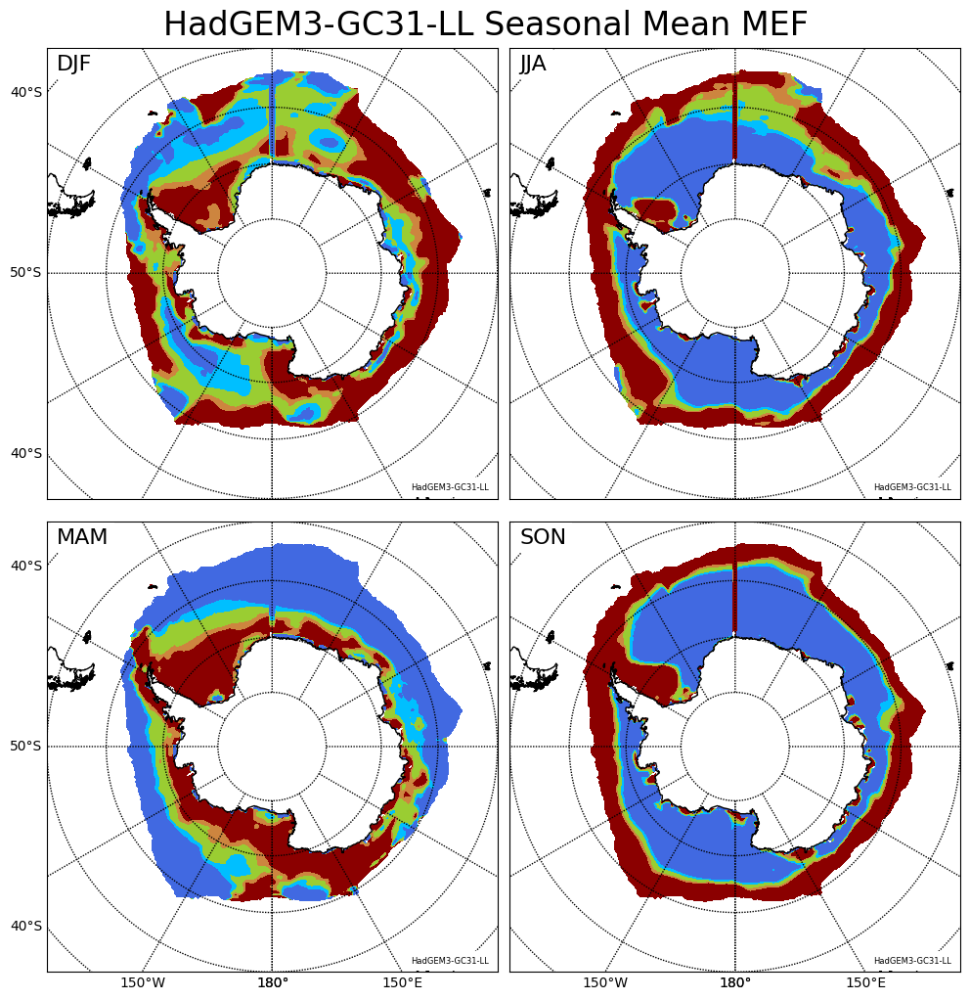

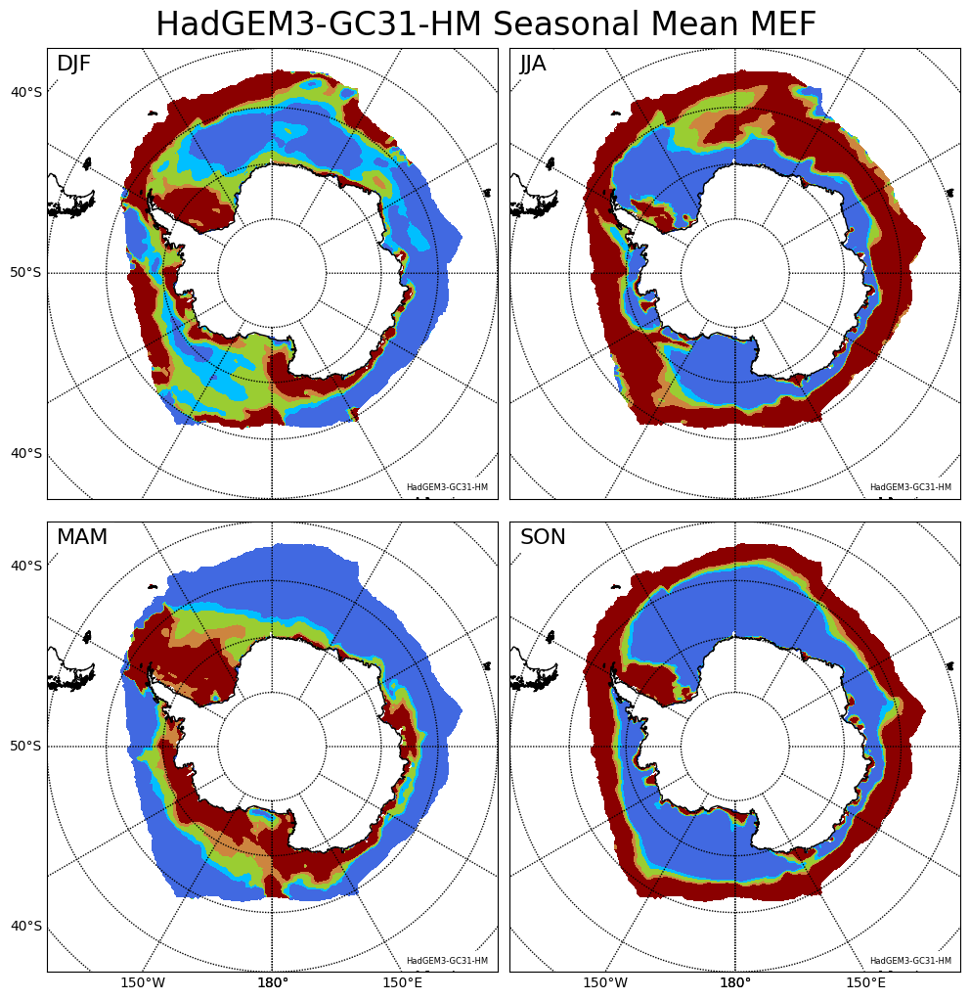

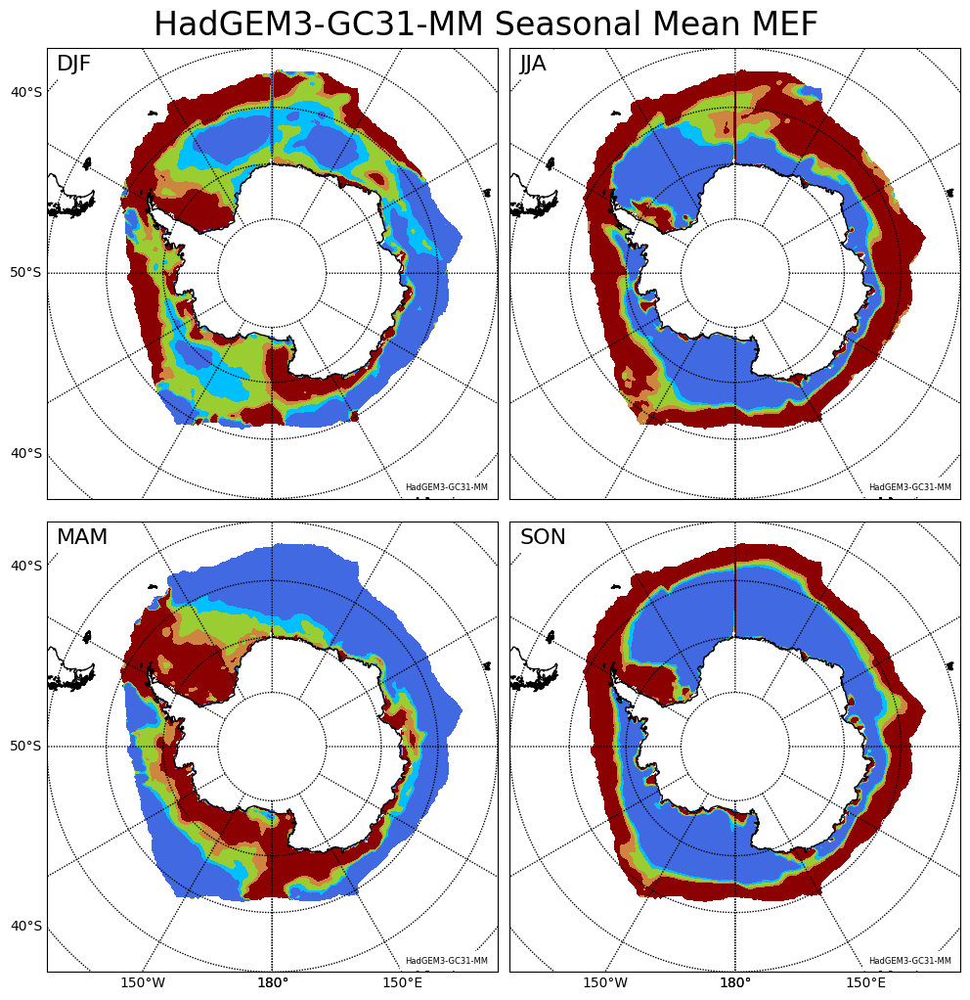

In [5]:
for j in range (mct):
    season = MEF_s['season'].values
    fig, axes = plt.subplots(2, 2, figsize=(10, 10))

    for i in range(4):
        ax = axes[i // 2, i % 2]
        m = Basemap(projection='spstere', boundinglat=-50, lon_0=180, resolution='l', ax=ax)
        x, y = m(ref_ds.longitude.values, ref_ds.latitude.values)
        contour = m.contourf(x, y, MEF_s[j,i,:,:].values, levels=levels, cmap=cmap, extend='min')
        m.drawcoastlines()
        if i // 2 == 1:
            m.drawmeridians(np.arange(-180., 181., 30.), labels=[0,0,0,1])
        else:
            m.drawmeridians(np.arange(-180., 181., 30.))
        if i % 2 == 0:
            m.drawparallels(np.arange(-90., 0., 10.), labels=[1,0,0,0])
        else:
            m.drawparallels(np.arange(-90., 0., 10.))
        
        # ax.set_title(f'{season[i]}')
        ax.text(0.022, 0.985, f'{season[i]}', transform=ax.transAxes, fontsize=16,
            verticalalignment='top', horizontalalignment='left', bbox=dict(facecolor='white', edgecolor='none'))
        ax.text(0.98, 0.015, f'{model[j]}', transform=ax.transAxes, fontsize=6,
            verticalalignment='bottom', horizontalalignment='right', bbox=dict(facecolor='white', edgecolor='none'))
    plt.tight_layout()
    fig.suptitle(f'{model[j]} Seasonal Mean MEF', fontsize=24, y=1.02) 
    
    # plt.savefig(f'/Data/PLOTS/Spatial/Seasonal-Mean/{model[j]}_SM.pdf', bbox_inches='tight') # Define desired plot image destination and name.

### 6. Plot Monthly Mean
Define desired plot image destination and name.

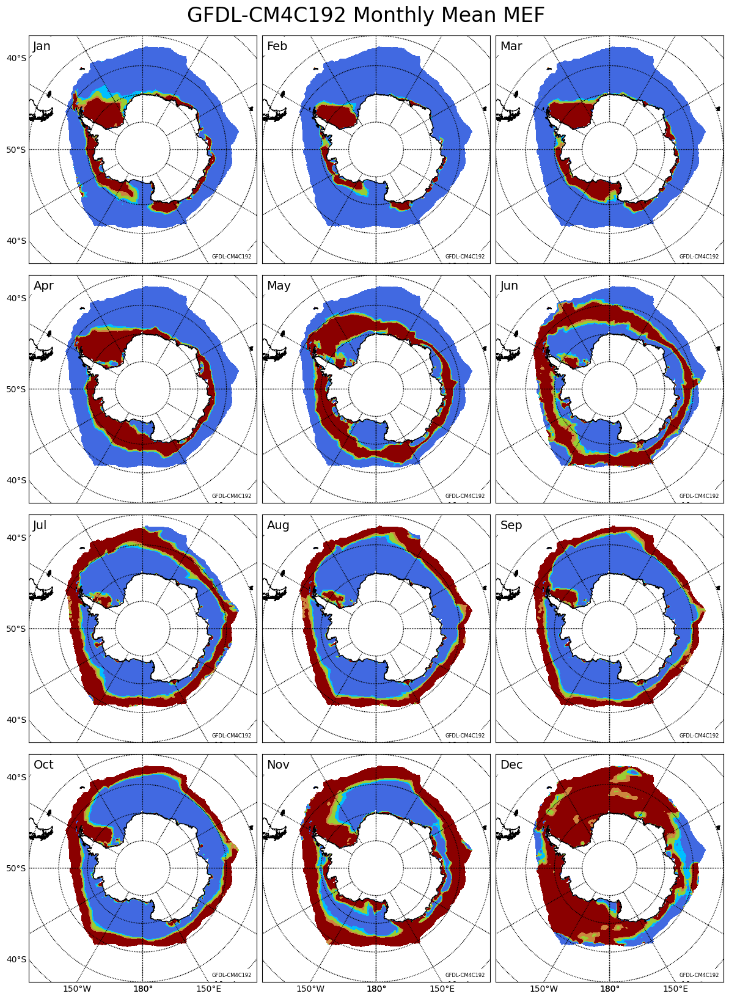

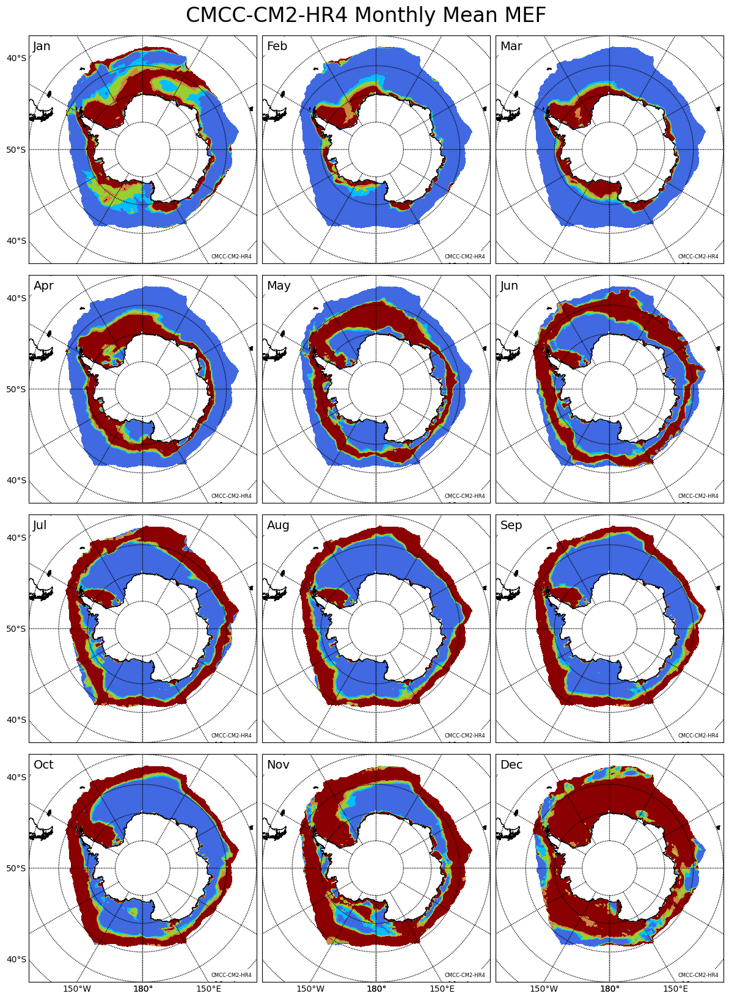

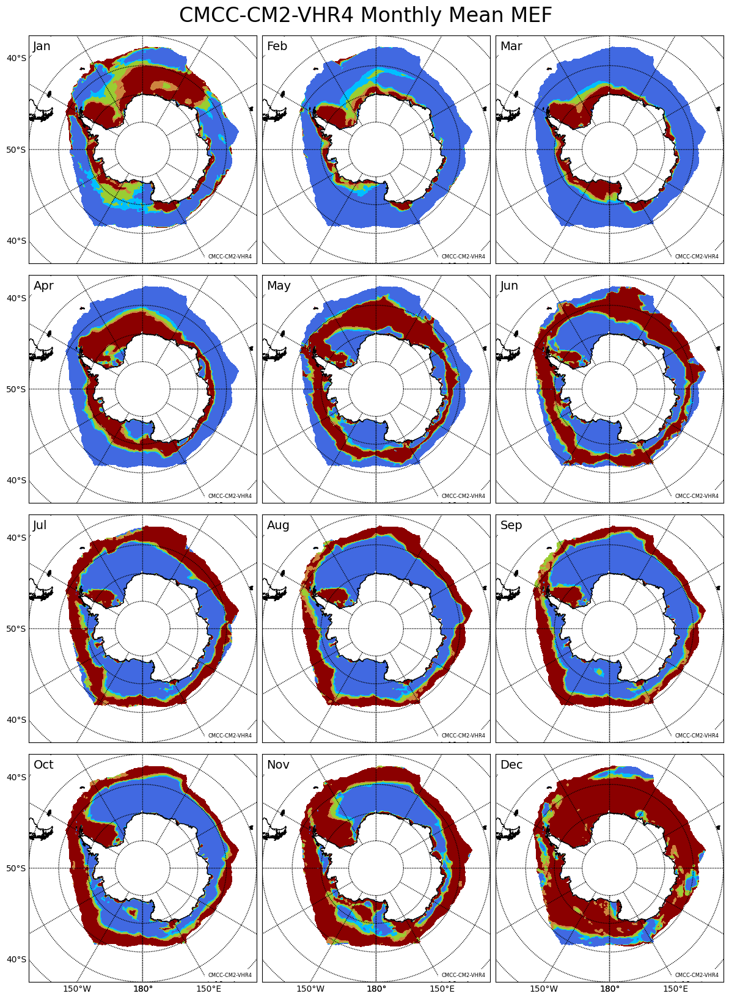

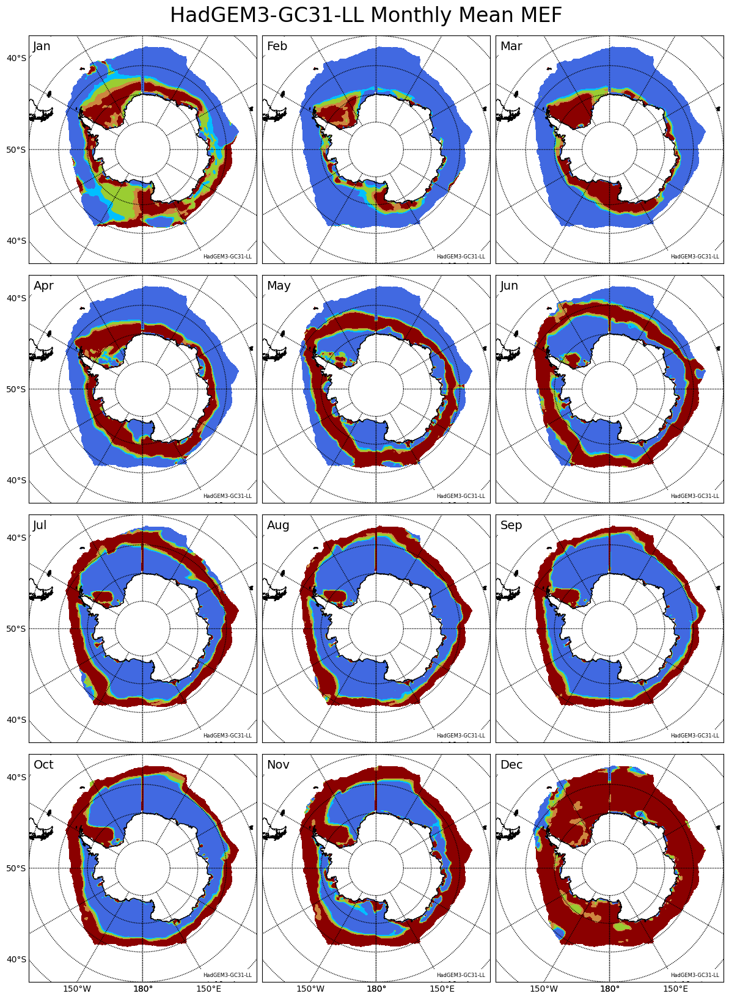

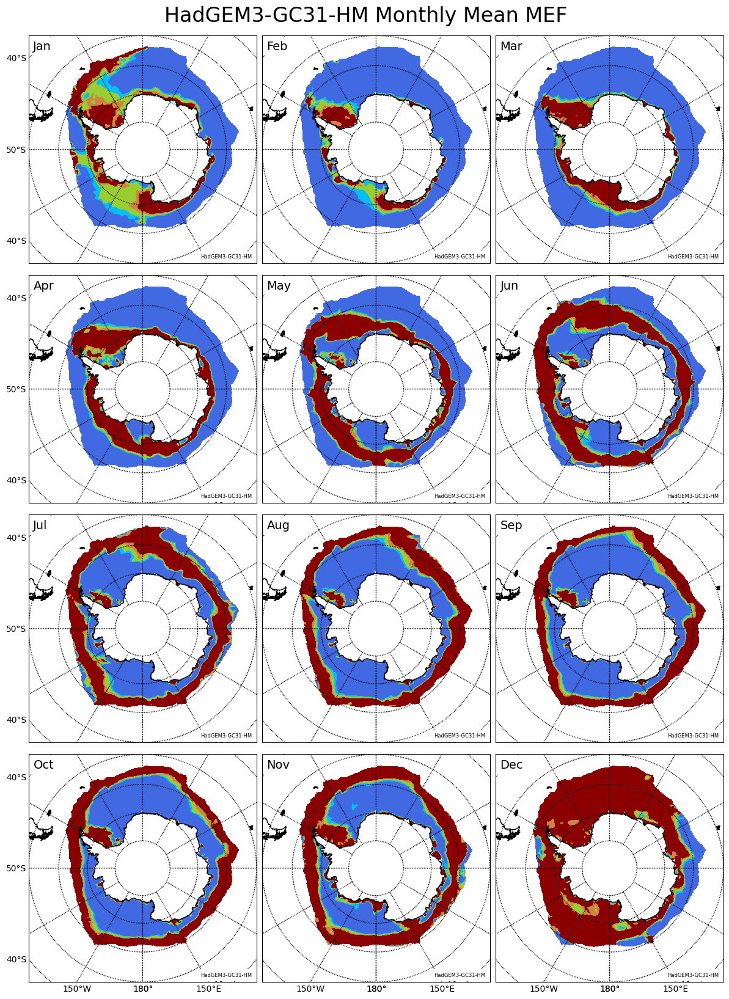

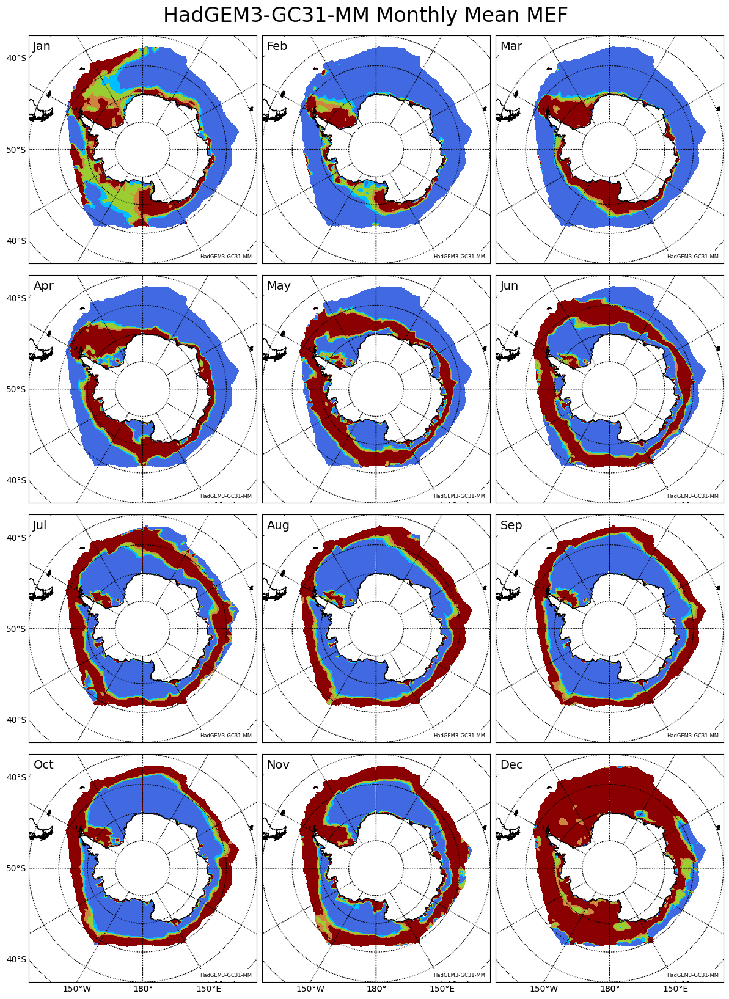

In [6]:
for j in range (mct):
    months = list(calendar.month_abbr)[1:]
    fig, axes = plt.subplots(4, 3, figsize=(12, 16))

    for i in range(12):
        ax = axes[i // 3, i % 3]
        m = Basemap(projection='spstere', boundinglat=-50, lon_0=180, resolution='l', ax=ax)
        x, y = m(ref_ds.longitude.values, ref_ds.latitude.values)
        contour = m.contourf(x, y, MEF_m[j,i,:,:].values, levels=levels, cmap=cmap, extend='min')
        m.drawcoastlines()
        if i // 3 == 3:
            m.drawmeridians(np.arange(-180., 181., 30.), labels=[0,0,0,1])
        else:
            m.drawmeridians(np.arange(-180., 181., 30.))
        if i % 3 == 0:
            m.drawparallels(np.arange(-90., 0., 10.), labels=[1,0,0,0])
        else:
            m.drawparallels(np.arange(-90., 0., 10.))
        
        # ax.set_title(f'{months[i]}')
        ax.text(0.02, 0.98, f'{months[i]}', transform=ax.transAxes, fontsize=14,
            verticalalignment='top', horizontalalignment='left', bbox=dict(facecolor='white', edgecolor='none'))
        ax.text(0.98, 0.018, f'{model[j]}', transform=ax.transAxes, fontsize=6,
            verticalalignment='bottom', horizontalalignment='right', bbox=dict(facecolor='white', edgecolor='none'))
        
    plt.tight_layout()
    fig.suptitle(f'{model[j]} Monthly Mean MEF', fontsize=24, y=1.02) 
    
    # plt.savefig(f'/PLOTS/Spatial/Monthly-Mean/{model[j]}_MM.pdf', bbox_inches='tight') # Define desired destination and name

### 7. Define Bar Graph Details

In [7]:
from matplotlib.colors import ListedColormap
import pandas as pd
# %% Plot Details
bins = [-np.inf, 0, 0.2, 0.5, 0.65, np.inf]
bins2 = [-np.inf, 1, 2, 3, 4, np.inf]
labels = ['Bad', 'Poor', 'Good', 'Very Good', 'Excellent',]
colors = {
    'Bad': 'firebrick',
    'Poor': 'sandybrown',
    'Good': 'yellowgreen',
    'Very Good': 'skyblue',
    'Excellent': 'royalblue',
}
cmap = ListedColormap(colors)

### 8. Plot Spatial Mean Time Series
Define desired plot image destination and name.

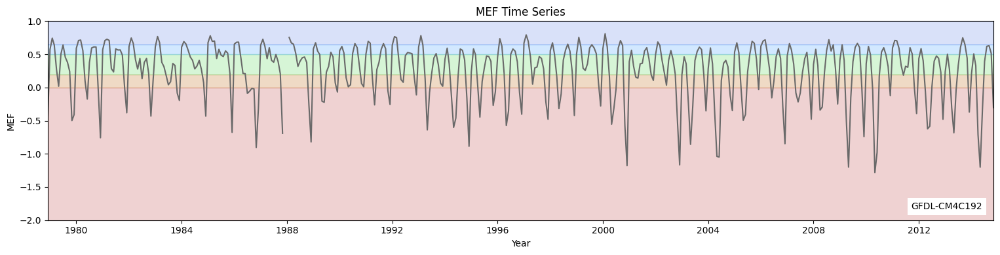

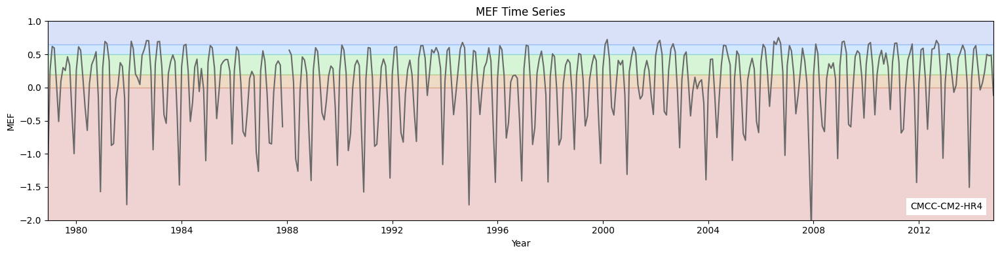

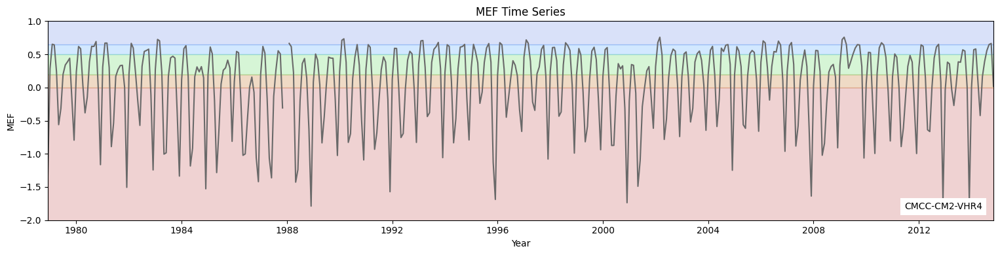

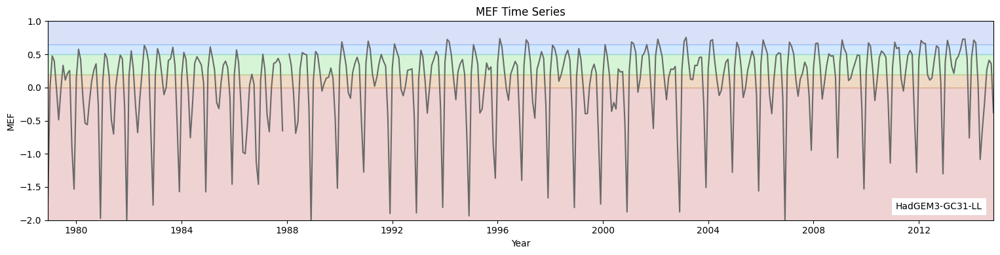

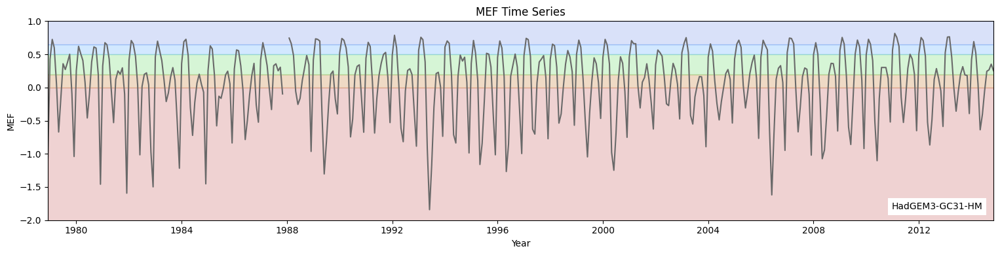

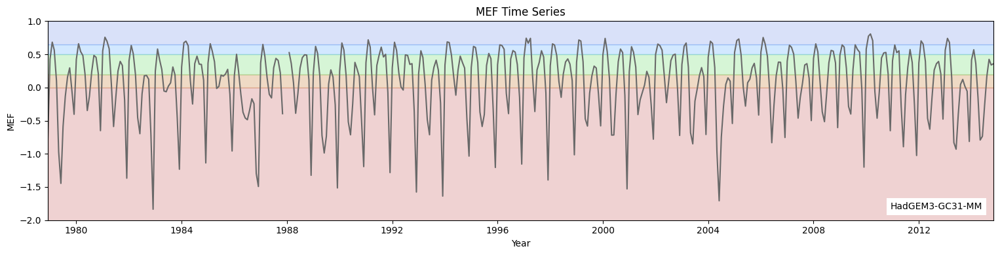

In [8]:
for j in range (mct):
    plt.figure(figsize=(16, 4))
    MEF_b[j,:].plot(color='dimgray')
    plt.ylim(bottom=-2, top = 1); plt.xlim(MEF_b.time.min(), MEF_b.time.max())
    
    plt.fill_between(MEF_b.time, -10, 0, color='firebrick', alpha=0.2, label='Bad')
    plt.fill_between(MEF_b.time, 0, 0.2, color='peru', alpha=0.3, label='Poor')
    plt.fill_between(MEF_b.time, 0.2, 0.5, color='limegreen', alpha=0.2, label='Good')
    plt.fill_between(MEF_b.time, 0.5, 0.65, color='dodgerblue', alpha=0.2, label='Very Good')
    plt.fill_between(MEF_b.time, 0.65, 1, color='royalblue', alpha=0.2, label='Excellent')
    plt.text(0.94, 0.18, f'{model[j]}', fontsize=10, bbox=dict(facecolor='white', edgecolor='none'), 
         transform=plt.gcf().transFigure, ha='right', va='bottom')
    plt.xlabel('Year'); plt.ylabel('MEF'); 
    plt.title('MEF Time Series')
    plt.tight_layout()
    
    # plt.savefig(f'/Data/PLOTS/Temporal/Time-Series/{model[j]}_TS.pdf', bbox_inches='tight') # Define desired plot image destination and name.

### 9. Plot Binned Seasonal Distribution
Define desired plot image destination and name.

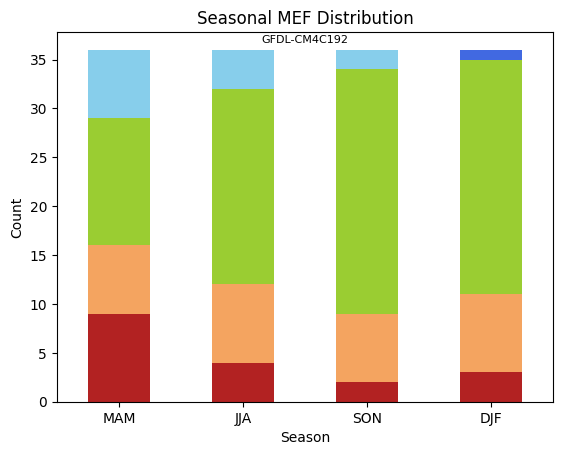

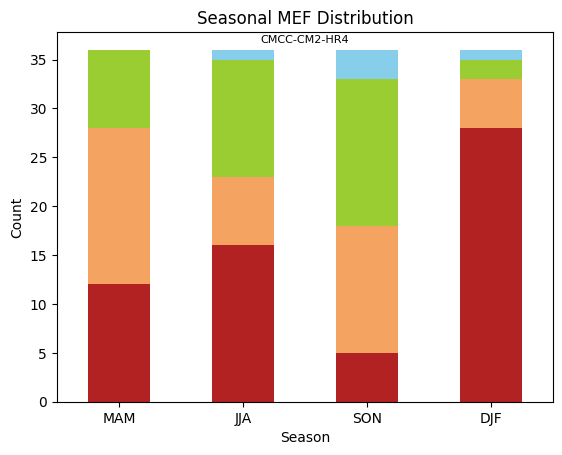

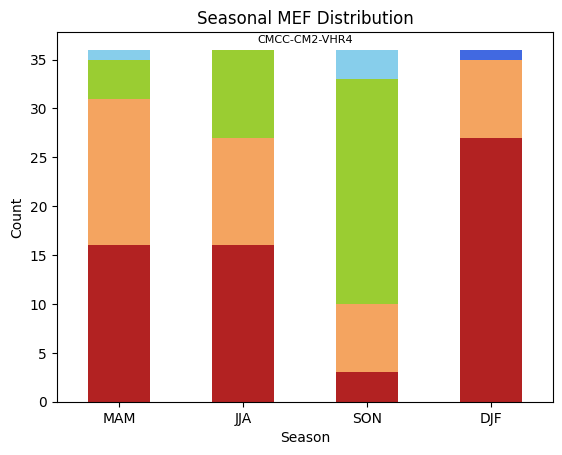

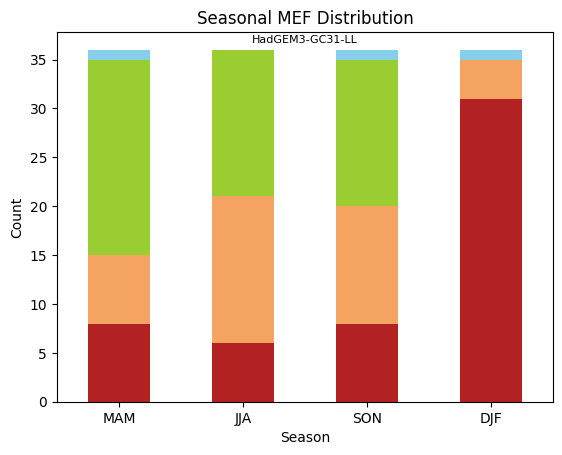

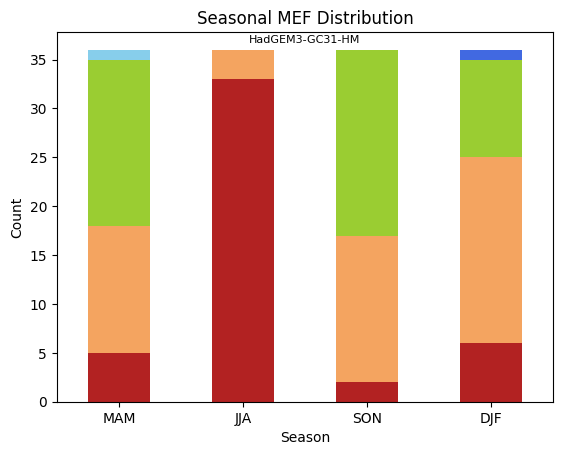

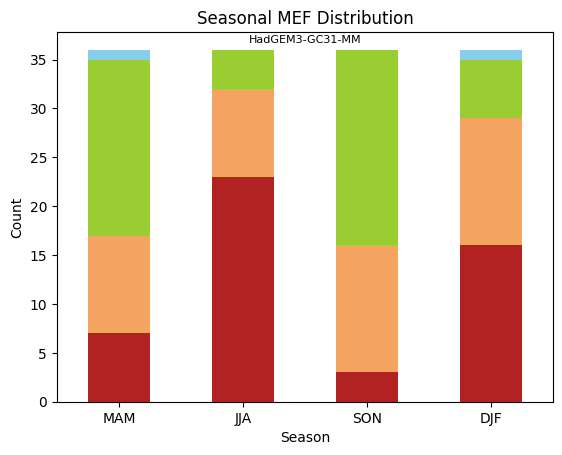

In [9]:
for j in range (mct):
    # %% Stacked Bar Graph - seasonaly
    seasonal_data = MEF_b[j,:].resample(tdim='QS-DEC').mean()
    
    def bin_data(array, bins):
        return np.digitize(array, bins)
    
    binned_data = xr.apply_ufunc(
        bin_data, seasonal_data, 
        input_core_dims=[[]], kwargs={'bins': bins})
    
    df = binned_data.to_dataframe(name='value').reset_index()
    
    # Count occurrences in each bin
    df['bin'] = pd.cut(df['value'], bins=bins2, labels=labels)
    bin_counts1 = df.groupby([df['tdim'].dt.month, 'bin'], observed=False).size().unstack(fill_value=0)
    bin_counts1.index = ['MAM', 'JJA', 'SON', 'DJF']
    bin_counts1 = bin_counts1.reindex([ 'DJF', 'MAM', 'JJA', 'SON',])
    
    # Plot stacked bar graph
    ax = bin_counts1.plot(kind='bar', stacked=True, color=[colors[label] for label in bin_counts1.columns])
    
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
    ax.legend().set_visible(False)
    plt.xlabel('Season'); plt.ylabel('Count');
    plt.text(0.5, 0.97, f'{model[j]}', fontsize=8, 
             bbox=dict(facecolor='none', edgecolor='none'), transform=ax.transAxes, ha='center')
    plt.title(f'Seasonal MEF Distribution')
    
    # plt.savefig(f'/Data/PLOTS/Temporal/Seasonal-Dist/{model[j]}_SD.pdf', bbox_inches='tight') # Define desired plot image destination and name.

### 10. Plot Binned Monthly Distribution
Define desired plot image destination and name.

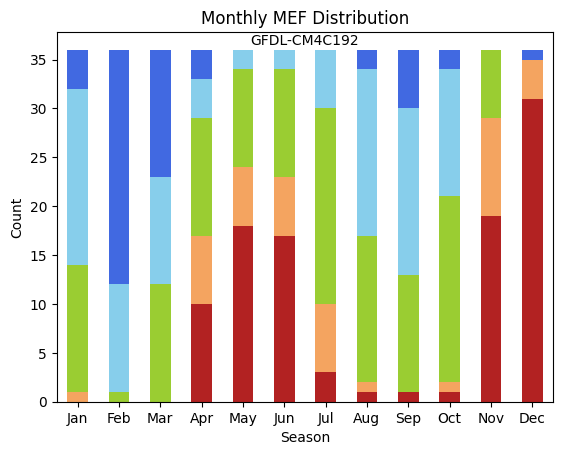

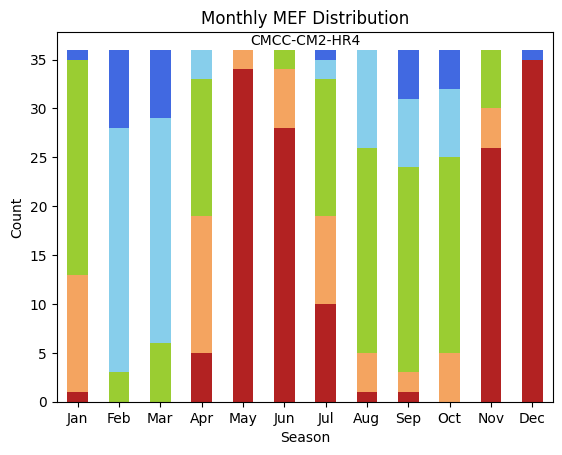

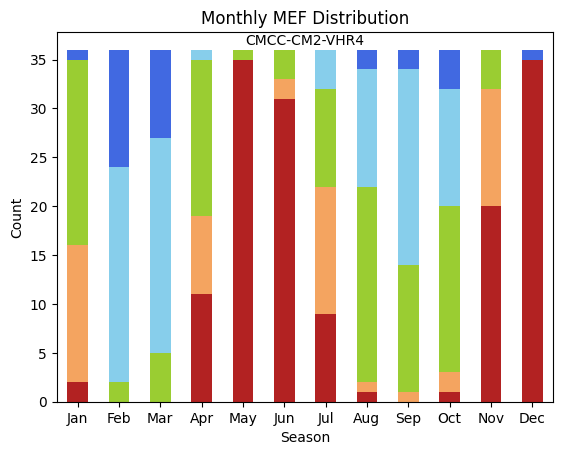

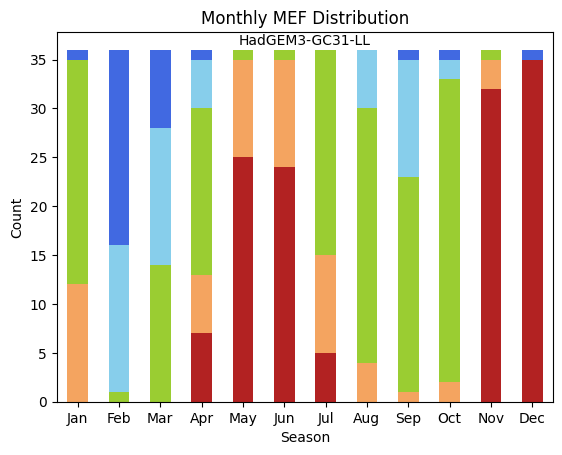

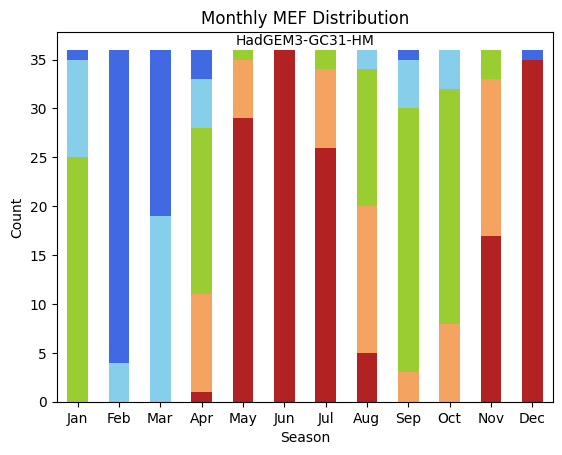

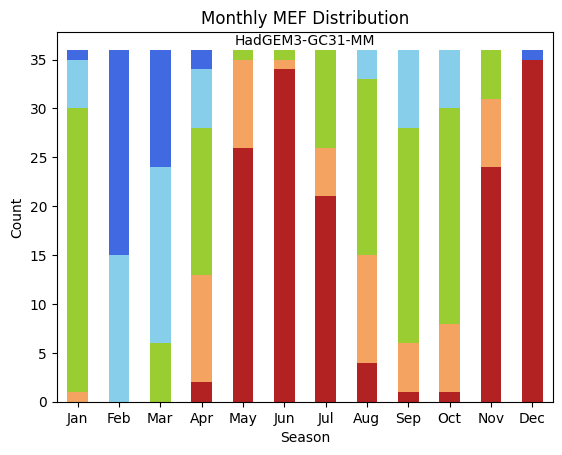

In [10]:
for j in range (mct):
    monthly_data = MEF_b[j,:].resample(tdim='MS').mean()
    
    def bin_data(array, bins):
        return np.digitize(array, bins)
    
    binned_data = xr.apply_ufunc(
        bin_data, monthly_data, 
        input_core_dims=[[]], kwargs={'bins': bins})
    
    df = binned_data.to_dataframe(name='value').reset_index()
    
    # Count occurrences in each bin
    df['bin'] = pd.cut(df['value'], bins=bins2, labels=labels)
    bin_counts = df.groupby([df['tdim'].dt.month, 'bin'], observed=False).size().unstack(fill_value=0)
    bin_counts.index = pd.to_datetime(bin_counts.index, format='%m').strftime('%b')
    
    # Plot stacked bar graph
    ax = bin_counts.plot(kind='bar', stacked=True, color=[colors[label] for label in bin_counts.columns])
    
    ax.set_xticklabels(bin_counts.index, rotation=0)
    ax.legend().set_visible(False)
    plt.xlabel('Season'); plt.ylabel('Count');
    plt.text(0.5, 0.965, f'{model[j]}', fontsize=10, 
             bbox=dict(facecolor='none', edgecolor='none'), transform=ax.transAxes, ha='center')
    plt.title('Monthly MEF Distribution')

    # plt.savefig(f'/Data/PLOTS/Temporal/Monthly-Dist/{model[j]}_MD.pdf', bbox_inches='tight') # Define desired plot image destination and name.

### 11. MEF Compressed Values

In [11]:
levels=[-100, 0, 0.2, 0.5, 0.65, 1.0]
colors = ['firebrick','sandybrown','yellowgreen','deepskyblue','royalblue']
cmap = mcolors.ListedColormap(colors)
norm = mcolors.BoundaryNorm(levels, cmap.N, clip=True)

Define desired plot image destination and name.

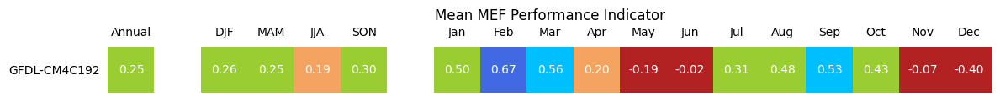

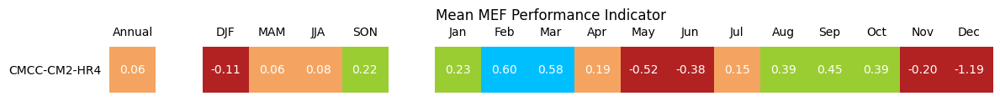

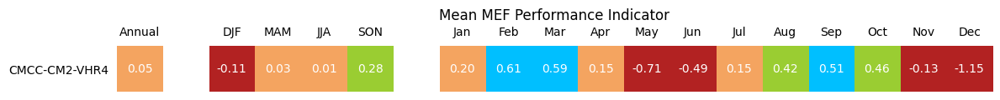

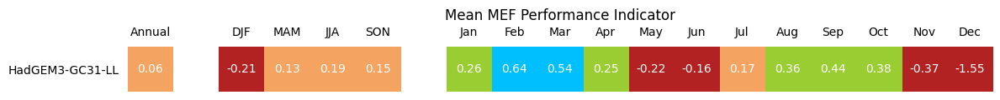

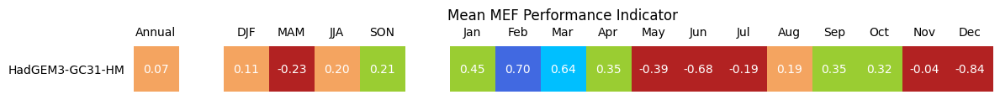

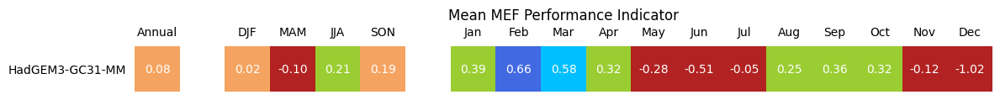

In [12]:
for k in range (mct):
    MEFA = MEF_b[k,:].mean(dim='tdim').values
    MEFS = MEF_b[k,:].groupby('time.season').mean(dim='tdim').values
    MEFM = MEF_b[k,:].groupby('time.month').mean(dim='tdim').values
    MEF_heat = np.concatenate([[MEFA], [np.nan], [MEFS[0]], [MEFS[2]], [MEFS[1]], [MEFS[3]], [np.nan], MEFM])
    values = MEF_heat.reshape(1,-1)
    
    fig, ax = plt.subplots(figsize=(12, 6))
    cax = ax.matshow(values, cmap=cmap, norm=norm)
    
    ax.set_yticks([0]); 
    ax.set_yticklabels([f'{model[k]}'])
    custom_labels = ['Annual','','DJF','MAM','JJA','SON','',
                     'Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
    ax.set_xticks(np.arange(values.shape[1]))
    ax.set_xticklabels(custom_labels, rotation=0)
    ax.tick_params(axis='y', left=False)
    ax.tick_params(axis='x', which='both', bottom=False, top=False)
    ax.set_title('Mean MEF Performance Indicator')
    
    for (i, j), val in np.ndenumerate(values):
        ax.text(j, i, f'{val:.2f}', ha='center', va='center', color='white')
    for spine in ax.spines.values():
        spine.set_visible(False)
    plt.tight_layout()
    
    # plt.savefig(f'/Data/PLOTS/Temporal/Compressed-PI/{model[k]}_PI.pdf', bbox_inches='tight') # Define desired plot image destination and name.